<a href="https://colab.research.google.com/github/pretentious7/LTCURECA2020/blob/master/BasicWaveSims.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#1D Wave Eq Test
import math
import numpy as np
from matplotlib import animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython import display
fig = plt.figure(figsize = (12,8))

TimeMax = 100
TimeStep = .01
TimeSize = int(TimeMax / TimeStep)
Interval = 1
XStep = .01
XMax = 10 + XStep
velocity = 1
wavelength = 2*math.pi
frequency = velocity/wavelength
k = 2*math.pi / wavelength
omega = 2*math.pi*frequency
time = 0
initialPos = 0
Amplitude = 1
DataWave1 = np.arange(0,XMax,XStep) #Ignore First Line!!!
DataWave1Append = []
X_Data = np.arange(0,XMax,XStep)
while time <= TimeMax:
    MaxDist = velocity * time
    InsideFunction = k*X_Data - omega*time
    ReplacedSubTime = np.where(X_Data >= MaxDist, 0, InsideFunction)
    SineNP = np.sin(ReplacedSubTime)
    DataWave1 = np.vstack((DataWave1, SineNP))
    time+=TimeStep
lines = plt.plot([])
line = lines[0]
plt.xlim(0,10)
plt.ylim(-1.1,1.1)
plt.title('Animated Wave 1 Dimension')
plt.xlabel('X Coordinate')
plt.ylabel('Amplitude')
def animate(i):
    y = DataWave1[i+1]
    line.set_data((X_Data,y))
    

anim = FuncAnimation(fig, animate, frames = TimeSize,
                                         interval= Interval )  

video = anim.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

In [ ]:
#1D Two Waves

import math
import numpy as np
from matplotlib import animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython import display
fig = plt.figure(figsize = (12,8))

TimeMax = 200
TimeStep = .01
TimeSize = int(TimeMax / TimeStep)
Interval = 1
XStep = .01
XMax = 20 + XStep
X_Data = np.arange(0,XMax,XStep)
#Wave1Info
velocity1 = .5
wavelength1 = 1.5*math.pi
frequency1 = velocity1/wavelength1
k1 = 2*math.pi / wavelength1
omega1 = 2*math.pi*frequency1
Amplitude1 = 3
initialPos1 = 0
time = 0
DataWave1 = np.arange(0,XMax,XStep) #Ignore First Line!!!
#Wave2Info
velocity2 = -2
wavelength2 = 2.5*math.pi
frequency2 = velocity2/wavelength2
k2 = 2*math.pi / wavelength2
omega2 = 2*math.pi*frequency2
Amplitude2 = 1
initialPos2 = 10
time = 0
DataWave2 = np.arange(0,XMax,XStep) #Ignore First Line!!!
while time <= TimeMax:
    MaxDist1 = velocity1 * time
    InsideFunction1 = k1*X_Data - omega1*time
    ReplacedSubTime1 = np.where(X_Data > MaxDist1, 0, InsideFunction1)
    SineNP1 = Amplitude1 * np.sin(ReplacedSubTime1)
    DataWave1 = np.vstack((DataWave1, SineNP1))
    time+=TimeStep
time = 0 
while time <= TimeMax:
    MaxDist2 = velocity2 * time
    InsideFunction2 = k2*(X_Data - initialPos2) - omega2*time
    ReplacedSubTime2 = np.where(X_Data < 20 + MaxDist2, 0, InsideFunction2)
    SineNP2 = Amplitude2 * np.sin(ReplacedSubTime2)
    DataWave2 = np.vstack((DataWave2, SineNP2))
    time+=TimeStep

DataWaveFull = DataWave1 + DataWave2
lines = plt.plot([])
line = lines[0]
plt.xlim(0,10)
plt.ylim(-1.1*(Amplitude1+Amplitude2),1.1*(Amplitude1+Amplitude2))
plt.title('Animated Wave 1 Dimension')
plt.xlabel('X Coordinate')
plt.ylabel('Amplitude')
def animate(i):
    y = DataWaveFull[i+1]
    line.set_data((X_Data, y))
    

anim = FuncAnimation(fig, animate, frames = TimeSize,
                                         interval= Interval )  
video = anim.to_html5_video()
html = display.HTML(video)
display.display(html)
plt.close()

In [ ]:
DataWave2[999], DataWave1[999]

(array([0.        , 0.        , 0.        , ..., 0.54402111, 0.53560333,
        0.527132  ]),
 array([0.527132  , 0.51860795, 0.51003204, ..., 0.        , 0.        ,
        0.        ]))

In [ ]:
#2D One Wave

import math
import numpy as np
from matplotlib import animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython import display

#fig = plt.figure()
#ax = fig.gca(projection='3d')
#rcParams['figure.figsize'] = 15, 15


TimeMax = 100
TimeStep = .01
TimeSize = int(TimeMax / TimeStep)
Interval = 1
XStep = .01
XMax = 10+XStep
YStep = .01
YMax = 10 + YStep
#Wave1Info
velocity1 = .5
wavelength1 = 1.5*math.pi
frequency1 = velocity1/wavelength1
k1 = 2*math.pi / wavelength1
omega1 = 2*math.pi*frequency1
Amplitude1 = 1
initialXPos1 = 0
initialYPos1 = 0
time = 0
DataWave1 = np.arange(0,XMax,XStep) #Ignore First Line!!!

n = 0
CoordData = np.arange(0, XMax, XStep)
while n < (YMax-YStep)/YStep:
    CoordDataStep = np.arange(0, XMax, XStep)
    CoordData = np.vstack((CoordData,CoordDataStep))
    n+=1
    
CoordData.shape
DataWave1 = CoordData
while time <= TimeMax//TimeStep:
    Intermediate1 = np.arange(0,XMax,XStep)
    MaxDist1 = velocity1*time*TimeStep
    G = 0
    while G<YMax//YStep:
        Pyth = np.sqrt(np.dot((YStep*G)**2,DataWave1[time,]**2))
        InsideFunction1 = k1*(CoordData[G] - initialXPos1) + k1*(G*YStep-initialYPos1) - omega1*time
        Fixed = np.where(Pyth < MaxDist1, 0, InsideFunction1)
        Intermediate1 = np.vstack((Intermediate1 ,Fixed))
        G+=1
    Intermeditate1 = Intermediate1[0:]
    SineNP1 = Amplitude1 * np.sin(Intermediate1)
    DataWave1 = np.stack((DataWave1,SineNP1))
    time += 1
DataWave1

ValueError: all input arrays must have the same shape

In [ ]:
#2D Wave

import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera



font = {'family' : 'normal',
        'weight': 'normal',
        'size'  : 35}	
plt.rc('font', **font)

plt.rc('xtick', labelsize=25)
plt.rc('ytick', labelsize=25)

omega = 2
class Wave:
    """ this class defines a wave with origin x0,y0 and angular freq omega """
    def __init__(self, x0, y0, velocity, wavelength):
        self.x0 = x0
        self.y0 = y0
        self.v = velocity
        self.len = wavelength

    def wave2D(self, x, y):
        wavetemp = lambda t : np.cos(((2*np.pi)/self.len)*
                (np.sqrt((x-self.x0)**2 + (y-self.y0)**2) - self.v* t))
        return wavetemp

wave1 = Wave(0,-1e-2, 3e8, 633e-9)
wave2 = Wave(0,1e-2,3e8,633e-9)
timeArr = np.linspace(0,1e-14,100)
yArr = np.linspace(-300e-5,300e-5,500)
tempWavePoints = [wave1.wave2D(100e-2,y) for y in yArr]
tempWave2Points = [wave2.wave2D(100e-2,y) for y in yArr]
def funcAdder(f,y):
    summa = lambda t : f(t) + y(t)
    return summa
summedArr = [funcAdder(f,g) for f,g in zip(tempWavePoints,tempWave2Points)]
someTime = lambda t : [f(t) for f in summedArr]
#print([x for x in map(someTime, timeArr)])
#print(summa(5))
fig = plt.figure(figsize=(60,20))
camera = Camera(fig)
for t in timeArr :
    plt.title('Animated Double Slit')
    plt.xlabel('Y Coordinate')
    plt.ylabel('Amplitude')
    plt.plot(yArr,someTime(t), color = 'blue', linewidth = 6)
    camera.snap()

#temp = np.fromiter(map(tempWavePoint,timeArr), dtype=np.float)
#print(temp)
#plt.plot(timeArr, np.fromiter(map(summedArr[1], timeArr),dtype=np.float))

animation = camera.animate()
animation.save(r'thisNew.gif', writer = 'imagemagick')


ModuleNotFoundError: ignored

In [ ]:
!pip install celluloid

MovieWriter PillowWriter unavailable; trying to use pillow instead.


TypeError: ignored

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


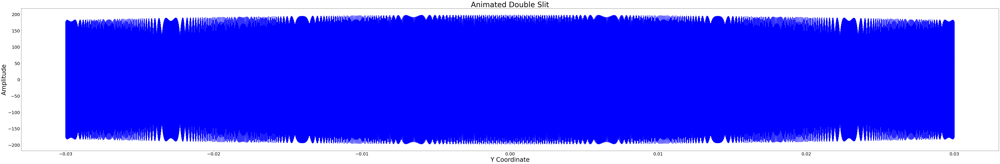

In [ ]:
#2D Wave Intensity 

import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera



font = {'family' : 'normal',
        'weight': 'normal',
        'size'  : 35}	
plt.rc('font', **font)

plt.rc('xtick', labelsize=25)
plt.rc('ytick', labelsize=25)

omega = 2
class Wave:
    """ this class defines a wave with origin x0,y0 and angular freq omega """
    def __init__(self, x0, y0, velocity, wavelength):
        self.x0 = x0
        self.y0 = y0
        self.v = velocity
        self.len = wavelength

    def wave2D(self, x, y):
        wavetemp = lambda t : (1/((x-self.x0)**2 + (y-self.y0)**2))*np.cos(((2*np.pi)/self.len)*
                (np.sqrt((x-self.x0)**2 + (y-self.y0)**2) - self.v* t))
        return wavetemp
YPos1 = -1e-2
YPos2 = 1e-2
wave1 = Wave(0,YPos1, 3e8, 633e-9)
wave2 = Wave(0,YPos2,3e8,633e-9)
timeArr = np.linspace(0,1e-14,150)
yArr = np.linspace(-3000e-5,3000e-5,5000)
tempWavePoints = [wave1.wave2D(100e-3,y) for y in yArr]
tempWave2Points = [wave2.wave2D(100e-3,y) for y in yArr]
def funcAdder(f,y):
    summa = lambda t : f(t) + y(t)
    return summa
summedArr = [funcAdder(f,g) for f,g in zip(tempWavePoints,tempWave2Points)]
someTime = lambda t : [f(t) for f in summedArr]
#print([x for x in map(someTime, timeArr)])
#print(summa(5))
fig = plt.figure(figsize=(100,15))
camera = Camera(fig)
for t in timeArr :
    plt.title('Animated Double Slit')
    plt.xlabel('Y Coordinate')
    plt.ylabel('Amplitude')
    plt.plot(yArr,someTime(t), color = 'blue', linewidth = 3)
    camera.snap()

#temp = np.fromiter(map(tempWavePoint,timeArr), dtype=np.float)
#print(temp)
#plt.plot(timeArr, np.fromiter(map(summedArr[1], timeArr),dtype=np.float))

animation = camera.animate()
animation.save(r'FartherAway.gif', writer = 'PillowWriter')
#FarAway
#thisNew

In [ ]:
sslsdakfnikdjsfn